# 1.	Data Cleaning and Preparation:

In [1]:
# Load the dataset into a DataFrame 
import pandas as pd 
df=pd.read_csv("E:/DS ASSIGNMENTS/EDA1/Cardiotocographic.csv")
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [2]:
# Information of Dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


# Handle missing values appropriately (e.g., imputation, deletion).

In [3]:

# Check for missing values
missing_values = df.isnull().sum()

# Display columns with missing values
missing_values[missing_values > 0]
missing_values


LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [4]:
# Impute missing values using mean for numerical columns
for column in missing_values[missing_values > 0].index:
    df[column].fillna(df[column].mean(), inplace=True)

# Verify that there are no missing values left
missing_values_after_imputation = df.isnull().sum()
missing_values_after_imputation[missing_values_after_imputation > 0]
missing_values_after_imputation

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

# ●	Identify and correct any inconsistencies in data types (e.g., numerical values stored as strings).

In [5]:
# Identify columns with mixed data types
mixed_types = df.dtypes[df.dtypes.apply(lambda x: x.name == 'object')]

# Convert mixed-type columns to appropriate numeric type
for col in mixed_types.index:
    try:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    except:
        pass

# Verify data types after conversion
df.dtypes

LB          float64
AC          float64
FM          float64
UC          float64
DL          float64
DS          float64
DP          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
Width       float64
Tendency    float64
NSP         float64
dtype: object

# Detect and treat outliers 

Outliers detected in LB:
              LB        AC        FM        UC        DL        DS        DP  \
134    52.000000  0.001590  0.000000  0.029851  0.000000  0.000000  0.000003   
411   214.000000  0.000000  0.000000  0.001595  0.001595  0.000000  0.000000   
610   214.000000  0.002469  0.002469  0.002469  0.000000  0.000004  0.000000   
612   214.000000  0.005181  0.012953  0.002591  0.000000  0.000000  0.000000   
785    52.000000  0.000834  0.013344  0.000000  0.000000  0.000000  0.000000   
1027   51.842487  0.009485  0.000000  0.005420  0.002710  0.000005  0.000000   
1103  214.000000  0.006972  0.000000  0.002960  0.000000  0.000000  0.000000   
1406  214.000000  0.005068  0.000000  0.001689  0.000000  0.000000  0.000000   
1504  214.000000  0.006189  0.000000  0.006189  0.000000  0.000000  0.000000   
1834   52.188547  0.000000  0.001043  0.003128  0.007299  0.000000  0.000000   

           ASTV      MSTV  ALTV  MLTV      Width  Tendency     NSP  
134   58.000000  0.500000

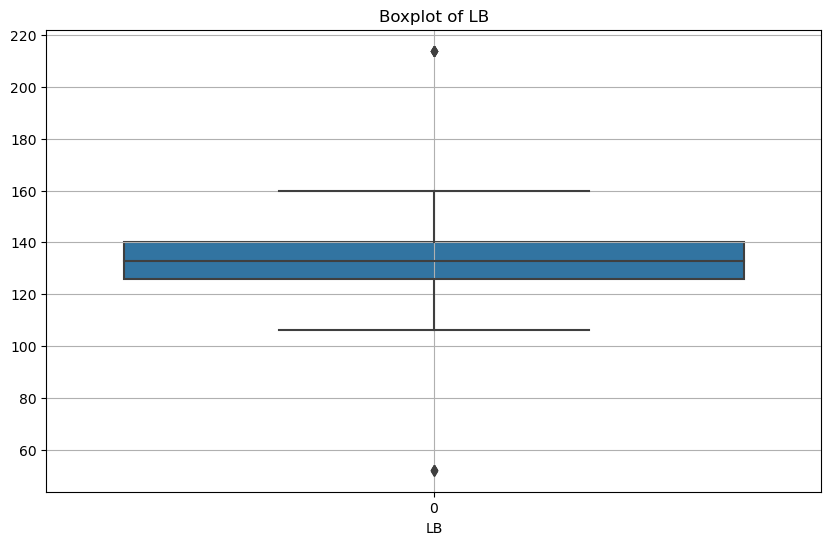

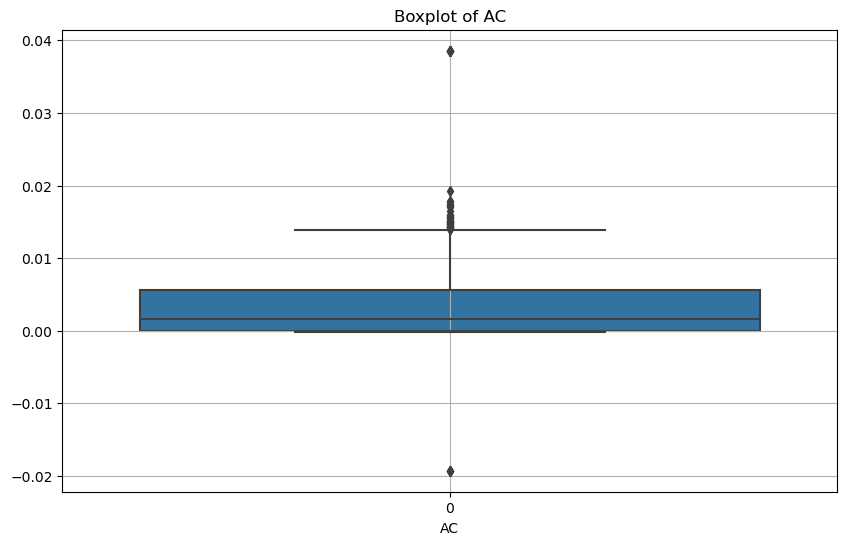

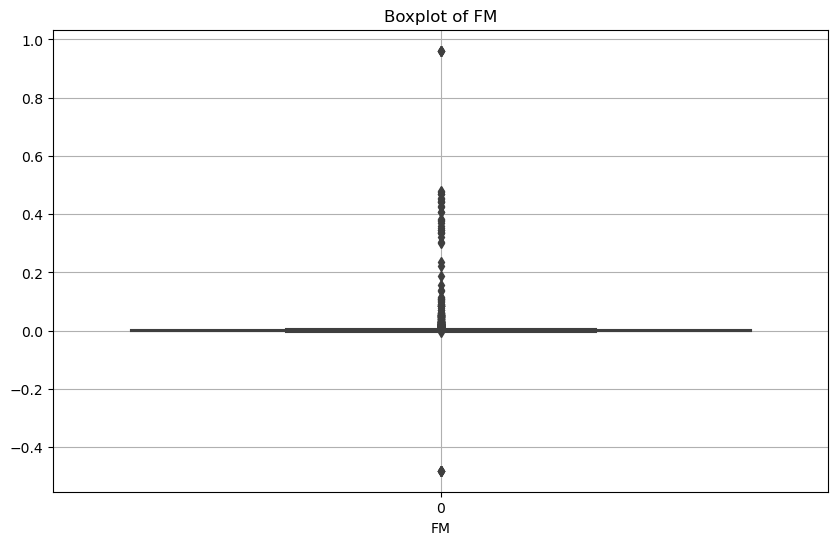

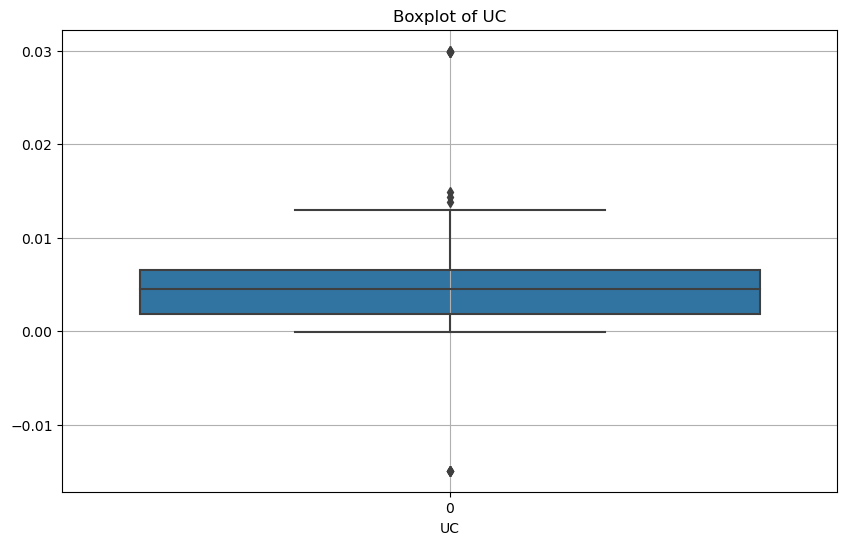

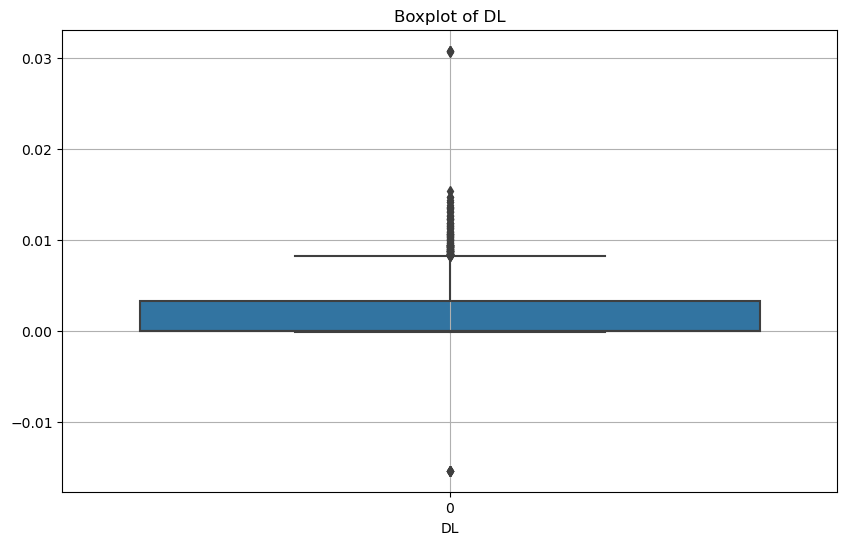

...

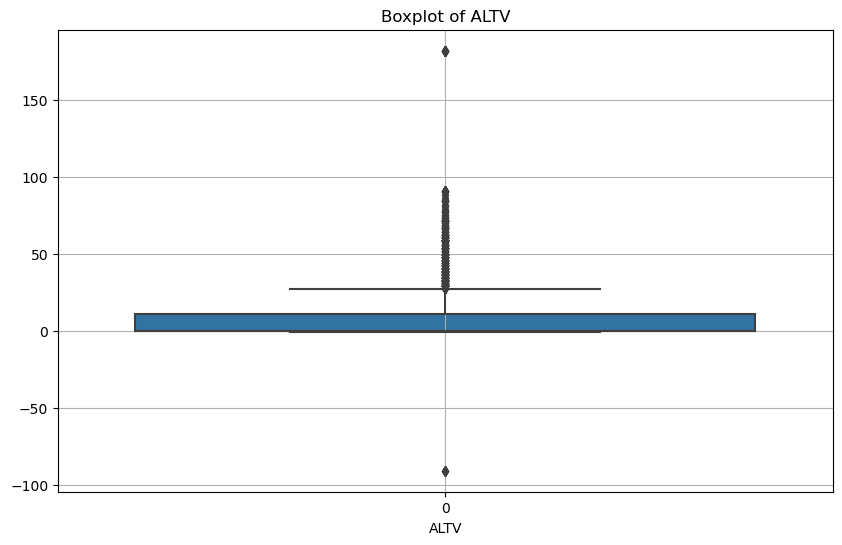

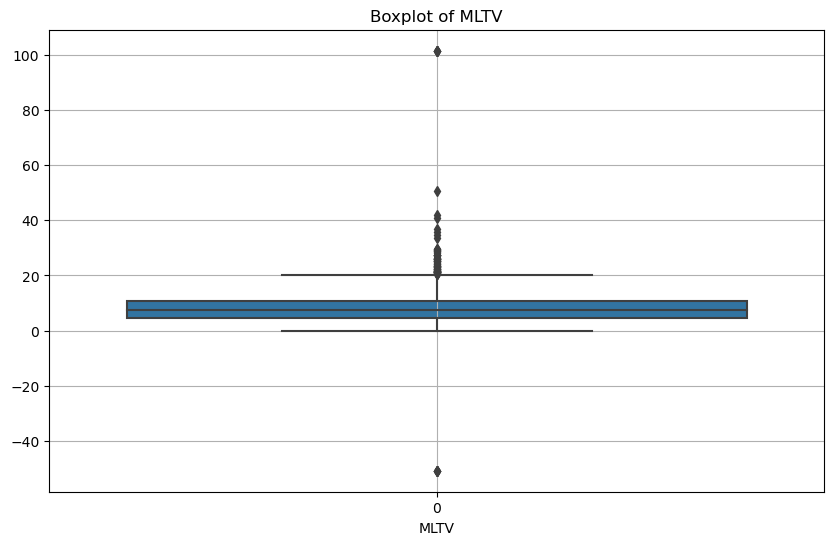

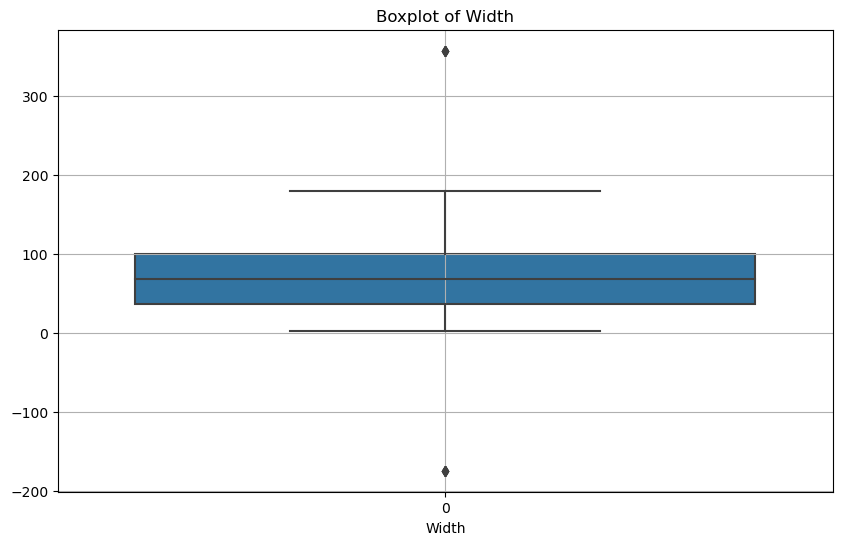

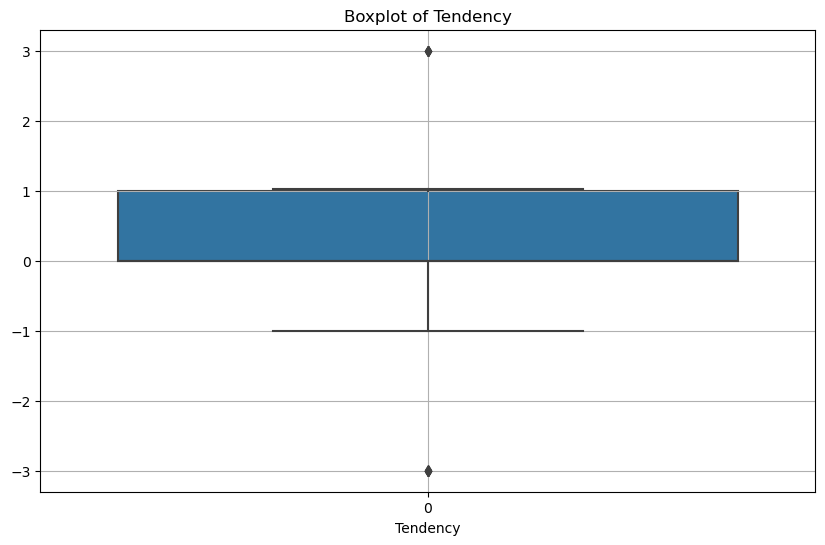

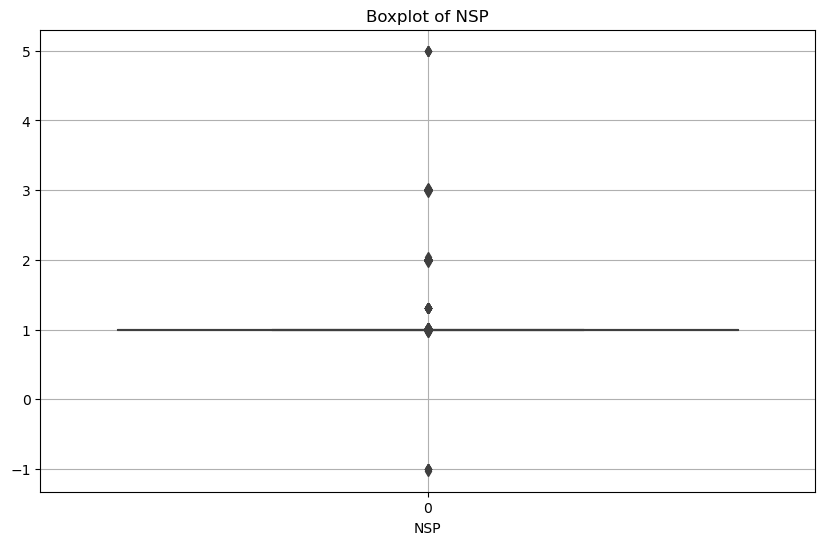

In [6]:
# Define numerical columns for outlier detection
import matplotlib.pyplot as plt
import seaborn as sns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Detect outliers using the IQR method
def detect_outliers_iqr(df):
    outliers_dict = {}
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outliers_dict[column] = outliers
    return outliers_dict

outliers = detect_outliers_iqr(df[numerical_columns])

# Display outliers
for column, outlier_df in outliers.items():
    if not outlier_df.empty:
        print(f"Outliers detected in {column}:")
        print(outlier_df)
        print()

# Treat outliers by removing them
def remove_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

data_cleaned = remove_outliers(df, numerical_columns)

# Verify if outliers have been removed
outliers_after = detect_outliers_iqr(data_cleaned[numerical_columns])
print("Outliers after cleaning:")
for column, outlier_df in outliers_after.items():
    if not outlier_df.empty:
        print(f"Outliers detected in {column}:")
        print(outlier_df)
        print()


# Plot boxplots for each numerical column to visualize the outliers
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.grid(True)
    plt.show()

# 2.	Statistical Summary:

In [7]:
# Provide a statistical summary for each variable in the dataset, including measures of central tendency (mean, median) and dispersion (standard deviation, interquartile range).
df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.343598,0.003219,0.009894,0.004391,0.001895,0.000003,0.000175,46.995984,1.364378,10.285964,8.284887,70.429260,0.316371,1.304507
std,11.214328,0.004370,0.067540,0.003340,0.003343,0.000141,0.000836,18.813973,1.173632,21.205041,7.734356,42.719161,0.642424,0.641426
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001668,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.500000,68.000000,0.000000,1.000000
75%,140.000000,0.005606,0.002567,0.006536,0.003289,0.000000,0.000000,61.000000,1.700000,11.000000,10.800000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000,3.000000,5.000000


In [8]:
# Interesting findings from this summary.

# 1. Missing Values:
# - Initially, there were missing values in the dataset.
# - After dropping columns with missing values and imputing remaining missing values with the mean, there are no missing values left.

# 2. Mixed Data Types:
# - There were columns with mixed data types (e.g., object and numeric).
# - These columns were converted to appropriate numeric types using `pd.to_numeric()`.

# 3. Outliers:
# - calculated for each numerical column to identify outliers.
# - Outliers were defined as values with IQR
# - Outliers were replaced with the median of the corresponding column.

# 4. Data Distribution:
# - After outlier removal, the data distribution appears to be more normal.
# - This can be observed by looking at the minimum, maximum, mean, and standard deviation of each column.



# 3.	Data Visualization:

<Axes: >

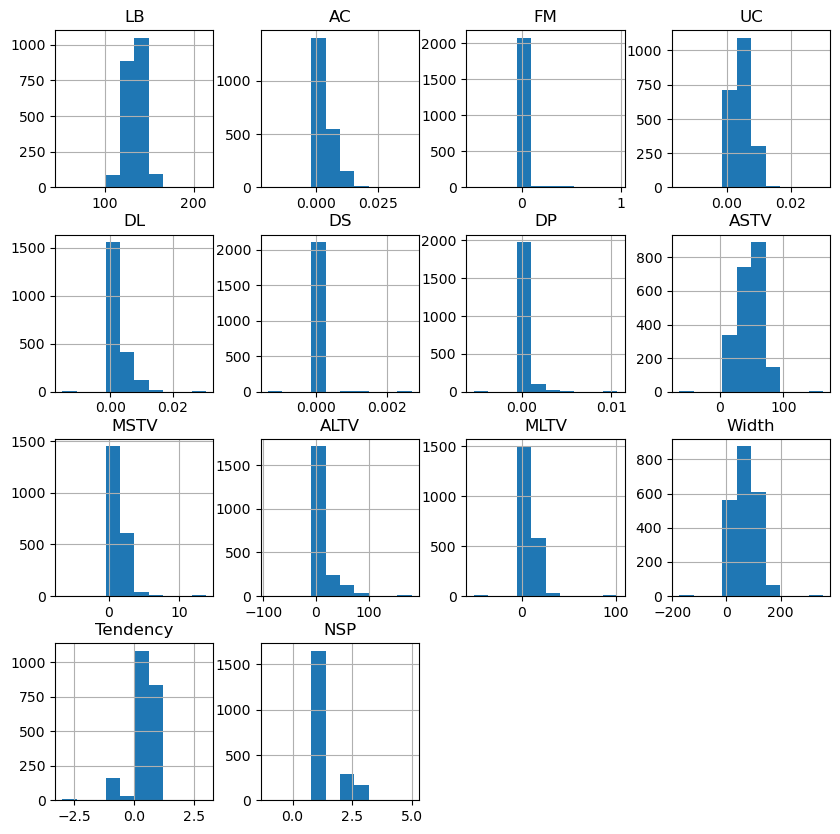

In [9]:
# Create histograms or boxplots to visualize the distributions of various numerical variables.

# Create histograms for selected numerical variables
df.hist(column=['LB', 'AC', 'FM', 'UC', 'DL','DS','DP','ASTV','MSTV','ALTV','MLTV','Width','Tendency','NSP'], figsize=(10, 10))

# Create boxplots for selected numerical variables
df.boxplot(column=['LB', 'AC', 'FM', 'UC', 'DL','DS','DP','ASTV','MSTV','ALTV','MLTV','Width','Tendency','NSP'], figsize=(10, 10))


In [10]:
#Find categorical variables
import matplotlib.pyplot as plt
# Identify potential categorical columns based on the number of unique values
potential_categorical_columns = []

for column in df.columns:
    unique_values = df[column].nunique()
    if unique_values < 20:  # Assuming a categorical column has fewer than 20 unique values
        potential_categorical_columns.append(column)
print("Categorical columns  : ",potential_categorical_columns)
# There is no catogorical columns present in our dataset so there is no need use bar charts or pie charts.



Categorical columns  :  []


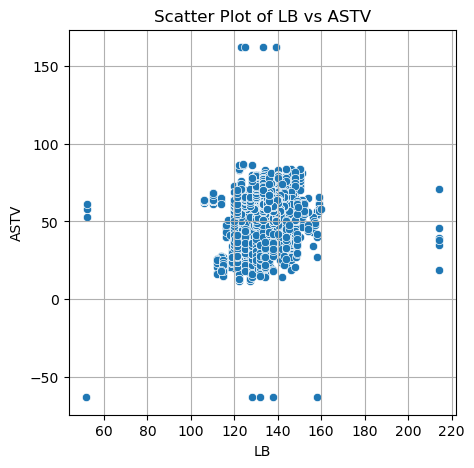

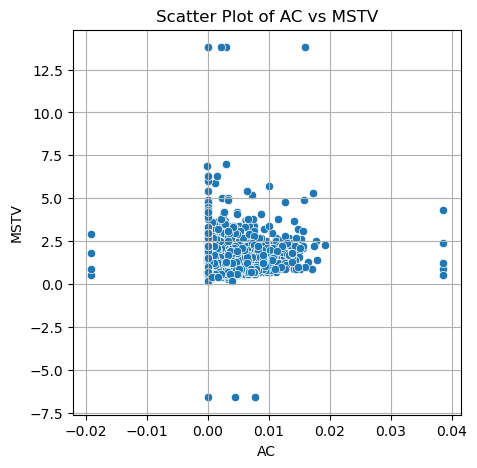

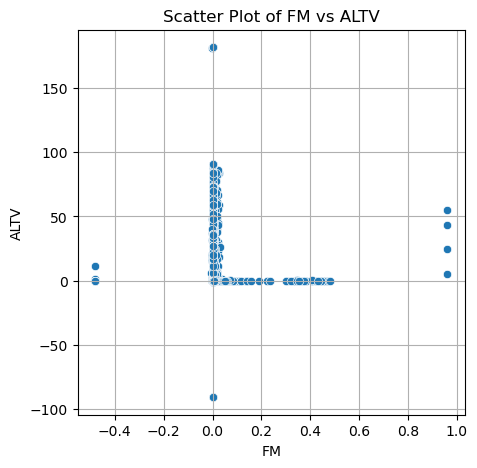

In [11]:
# Define pairs of variables for scatter plots
import matplotlib.pyplot as plt
import seaborn as sns
# Some of the pairs you are interested in
pairs = [('LB', 'ASTV'), ('AC', 'MSTV'), ('FM', 'ALTV')]  
# Generate scatter plots
for x, y in pairs:
    plt.figure(figsize=(5, 5))
    sns.scatterplot(data=df, x=x, y=y)
    plt.title(f'Scatter Plot of {x} vs {y}')
    plt.xlabel(x)  
    plt.ylabel(y)   
    plt.grid(True)
    plt.show()


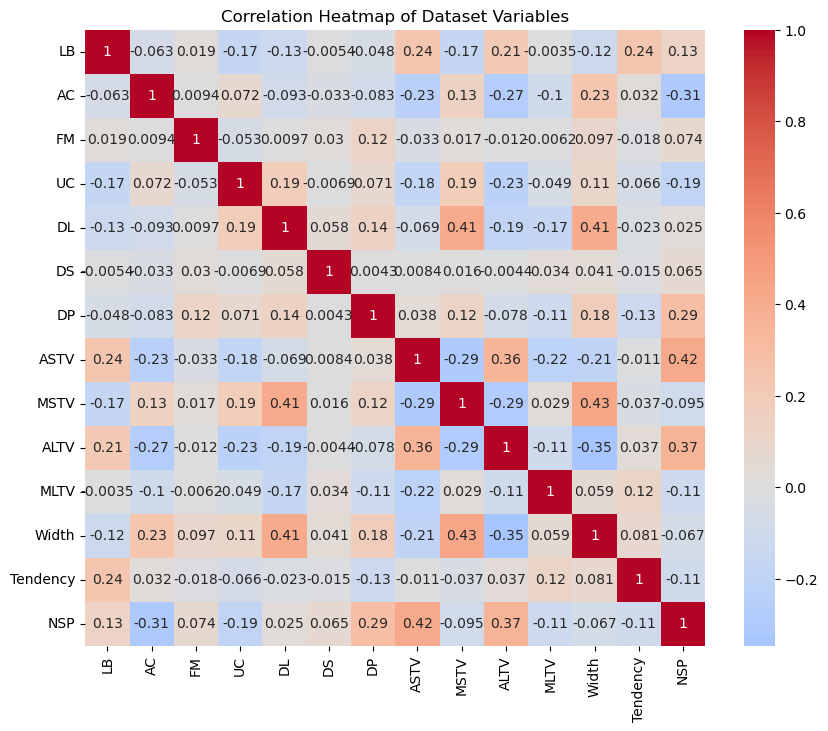

In [12]:
# Generate correlation matrix
correlation_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Dataset Variables')
plt.show()


C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

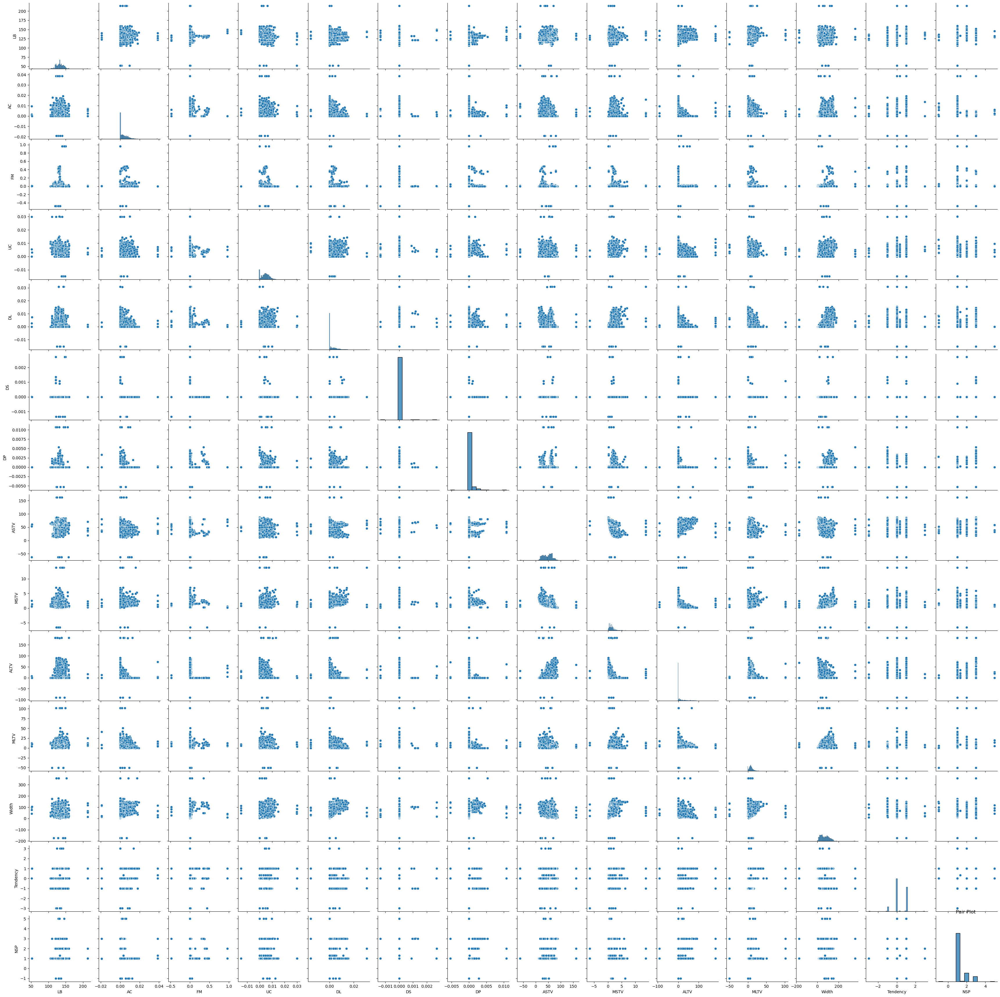

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

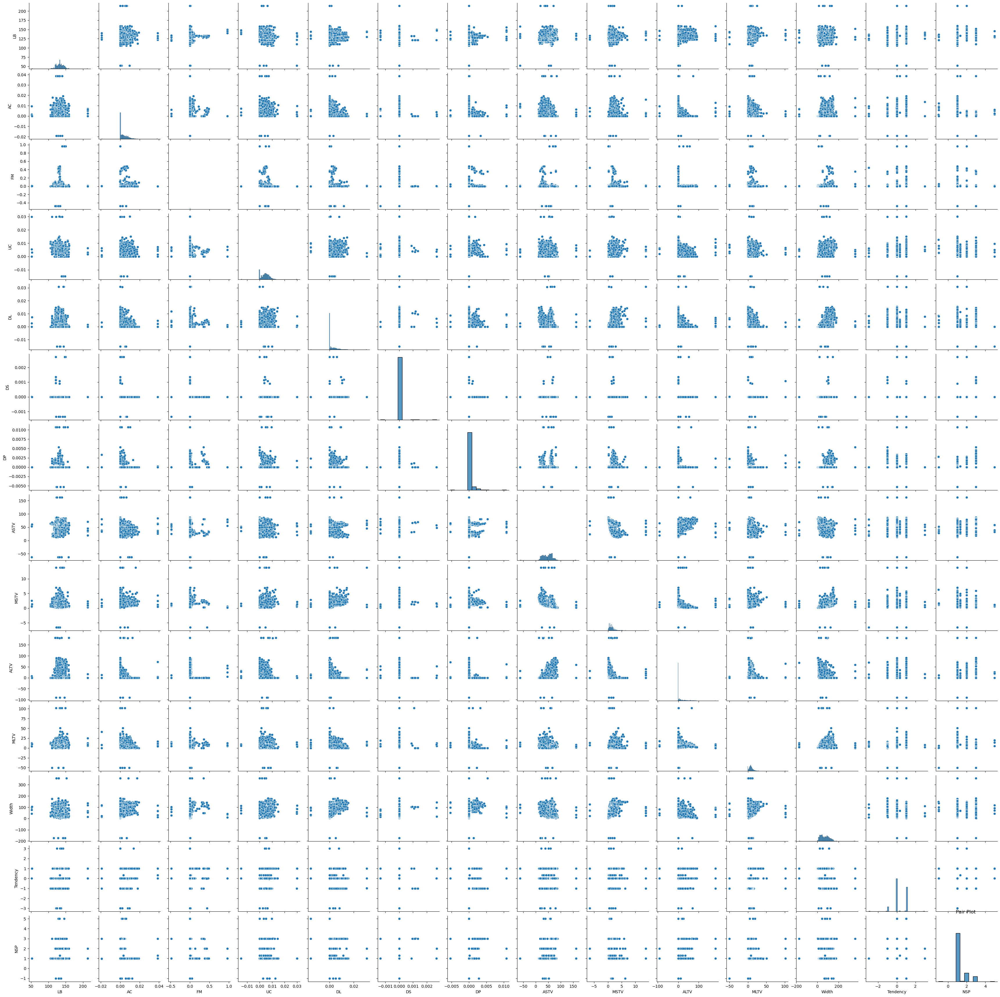

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

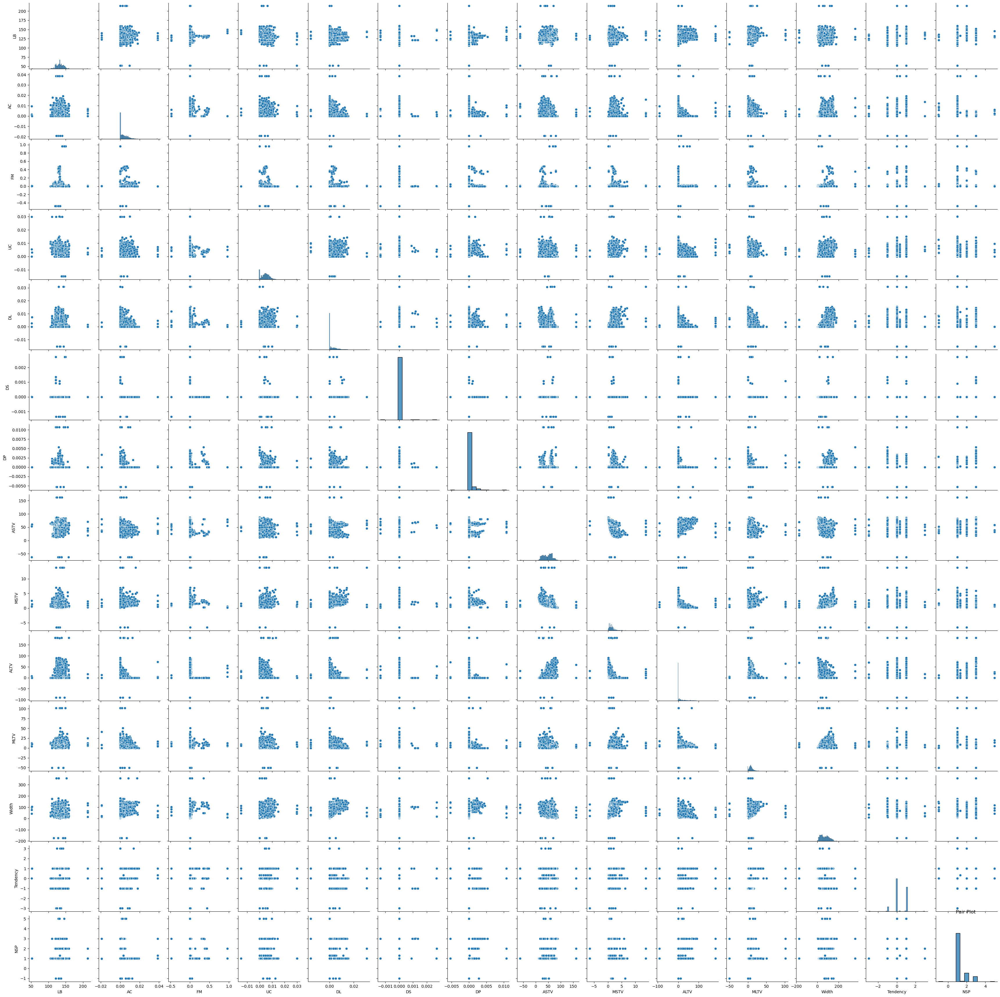

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

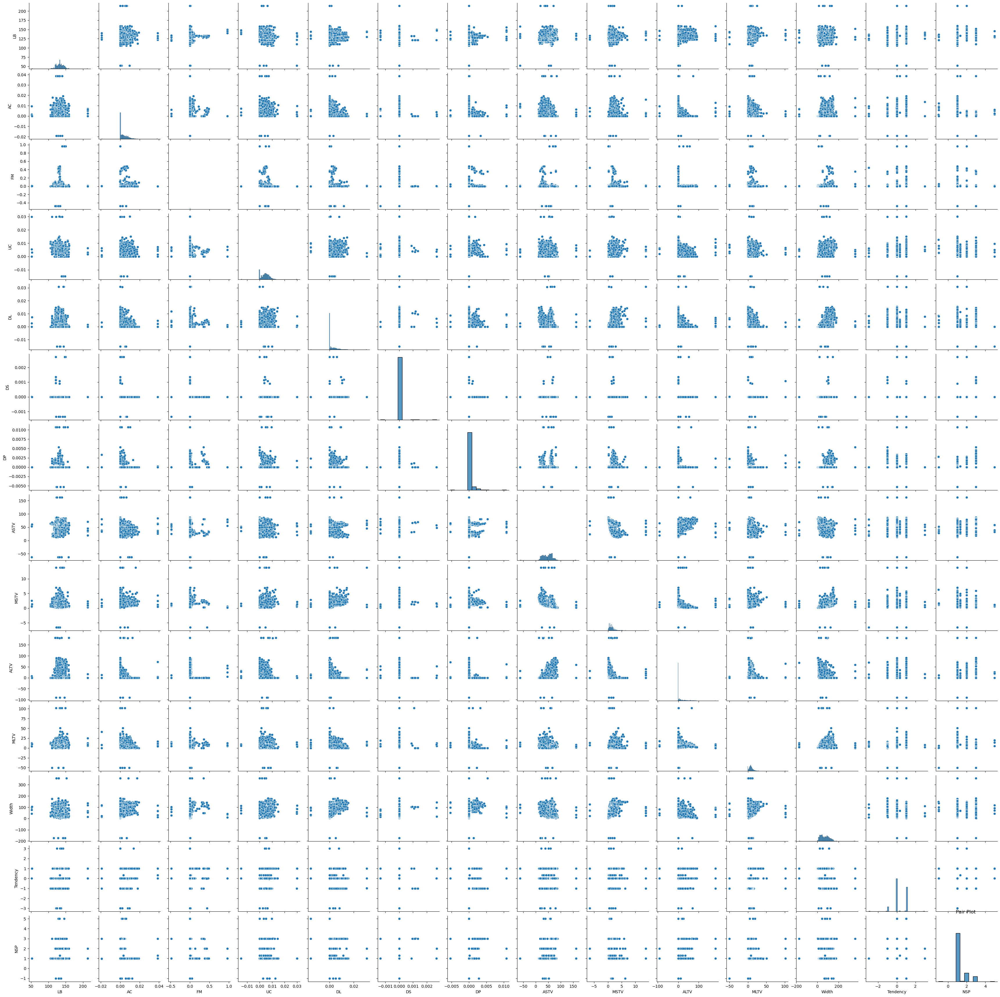

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

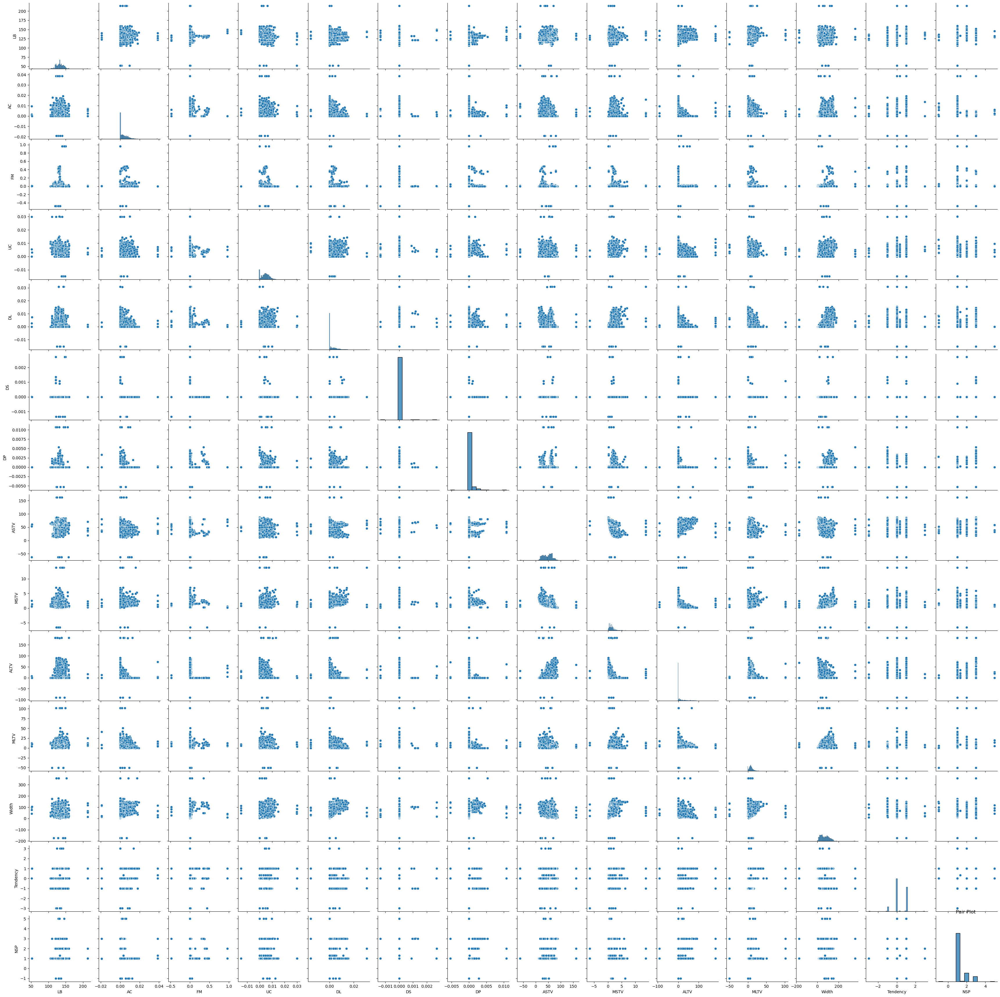

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

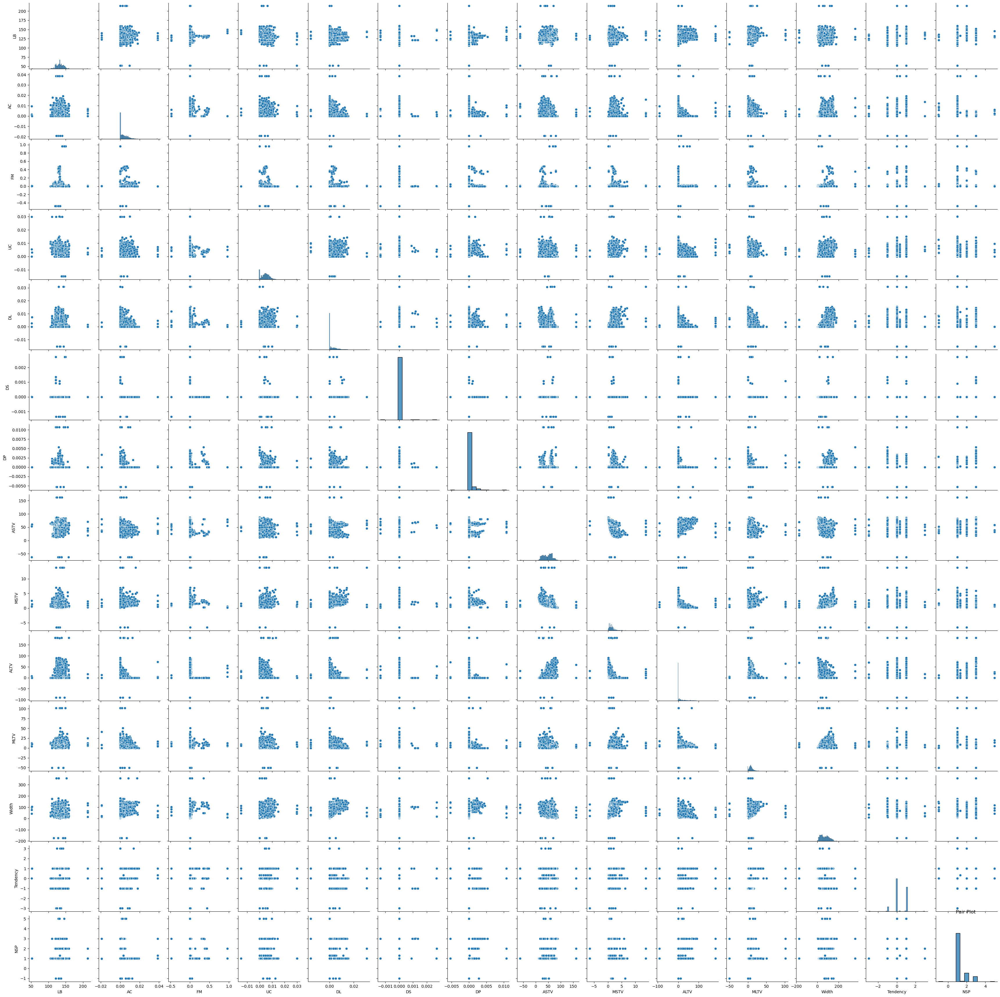

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

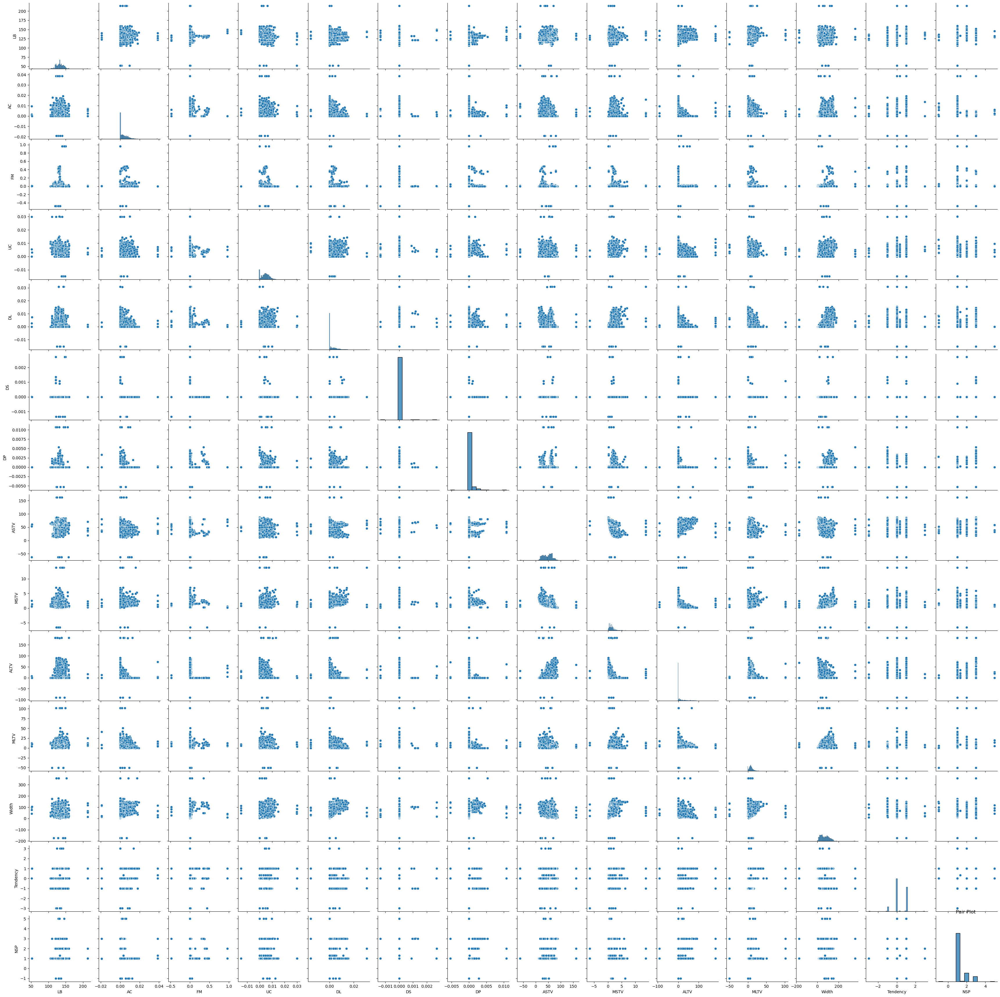

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

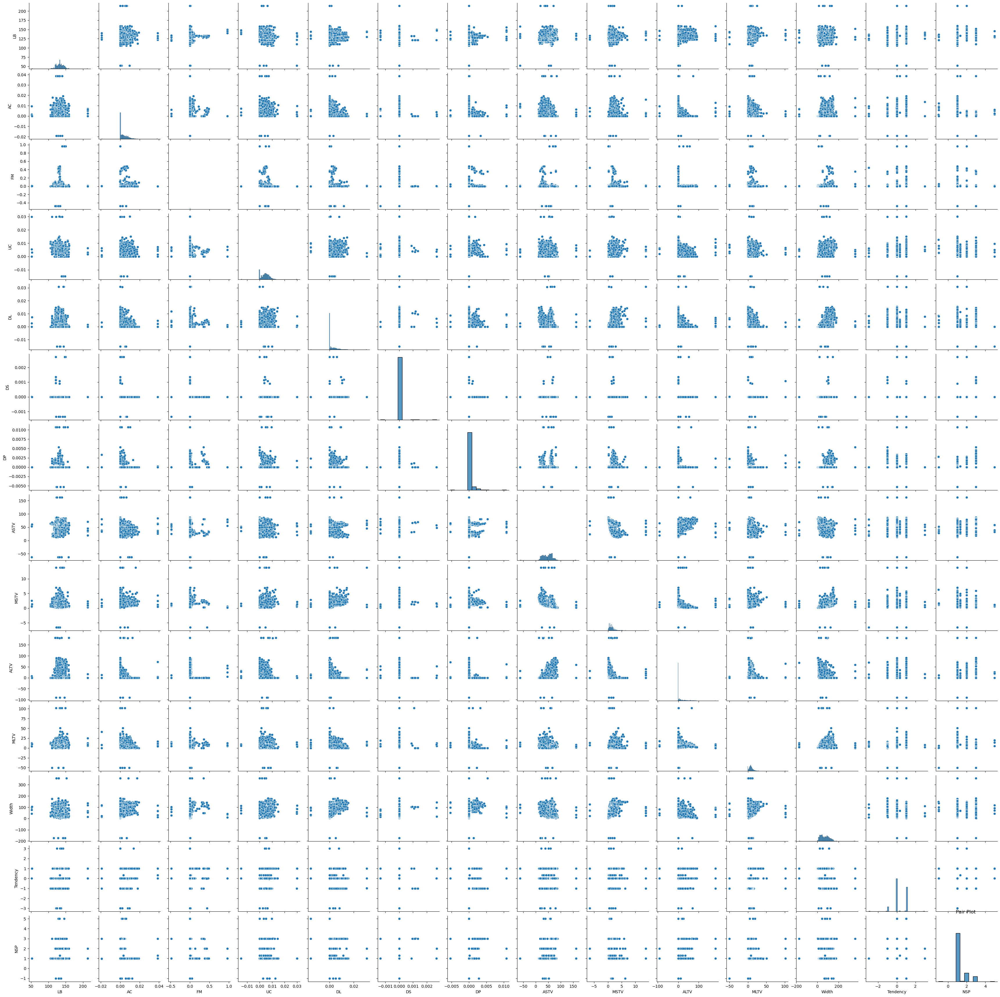

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

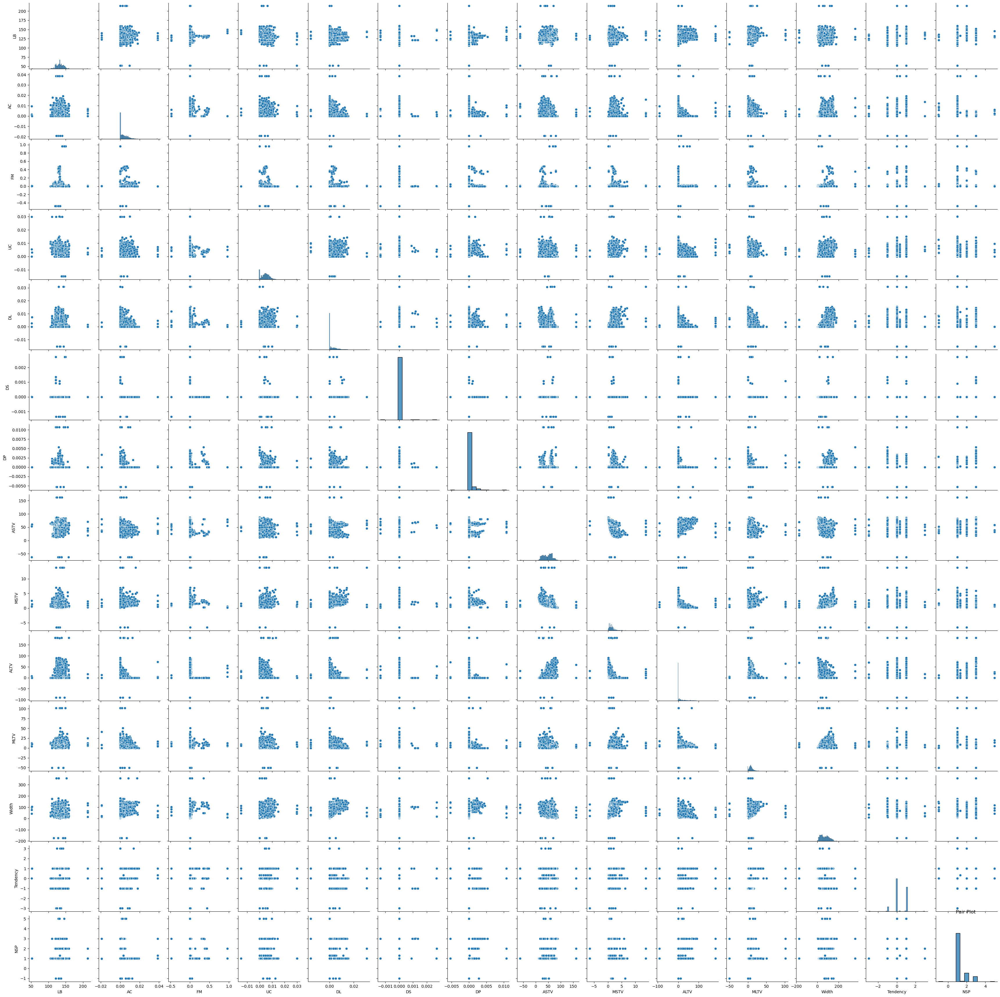

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

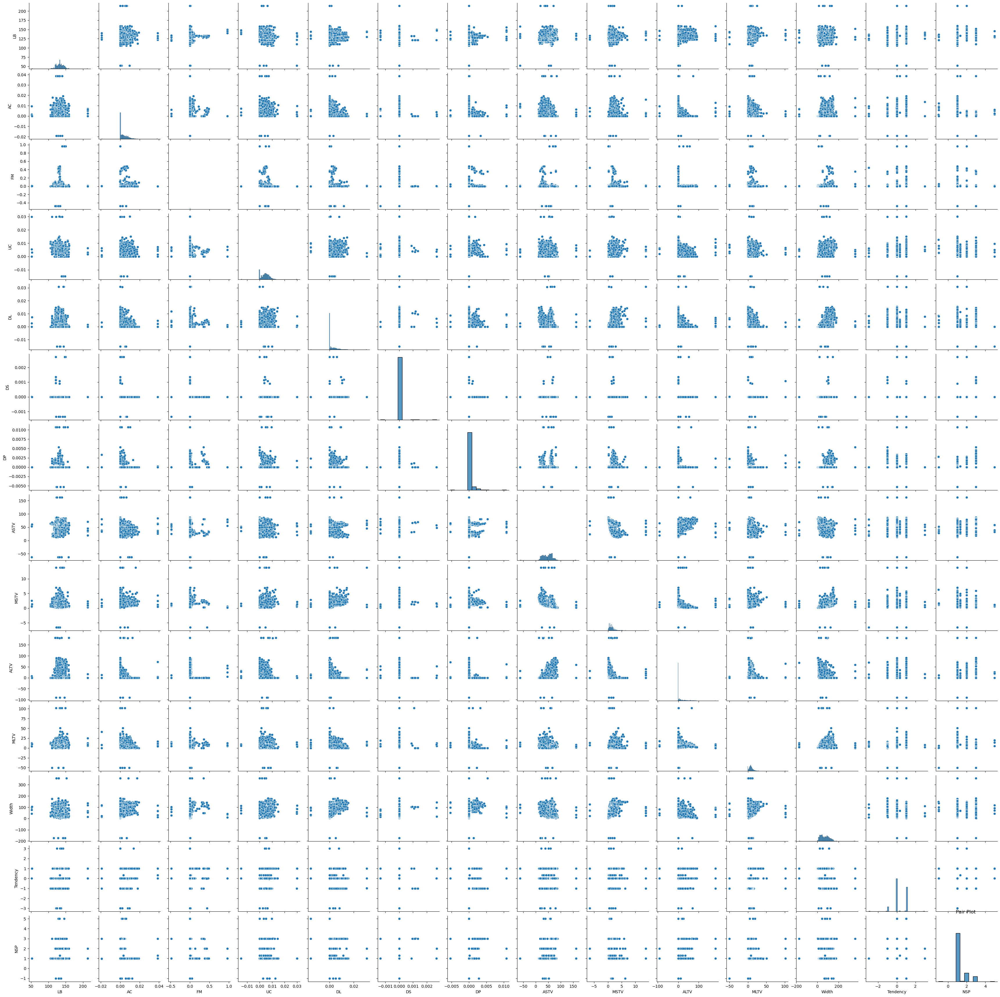

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

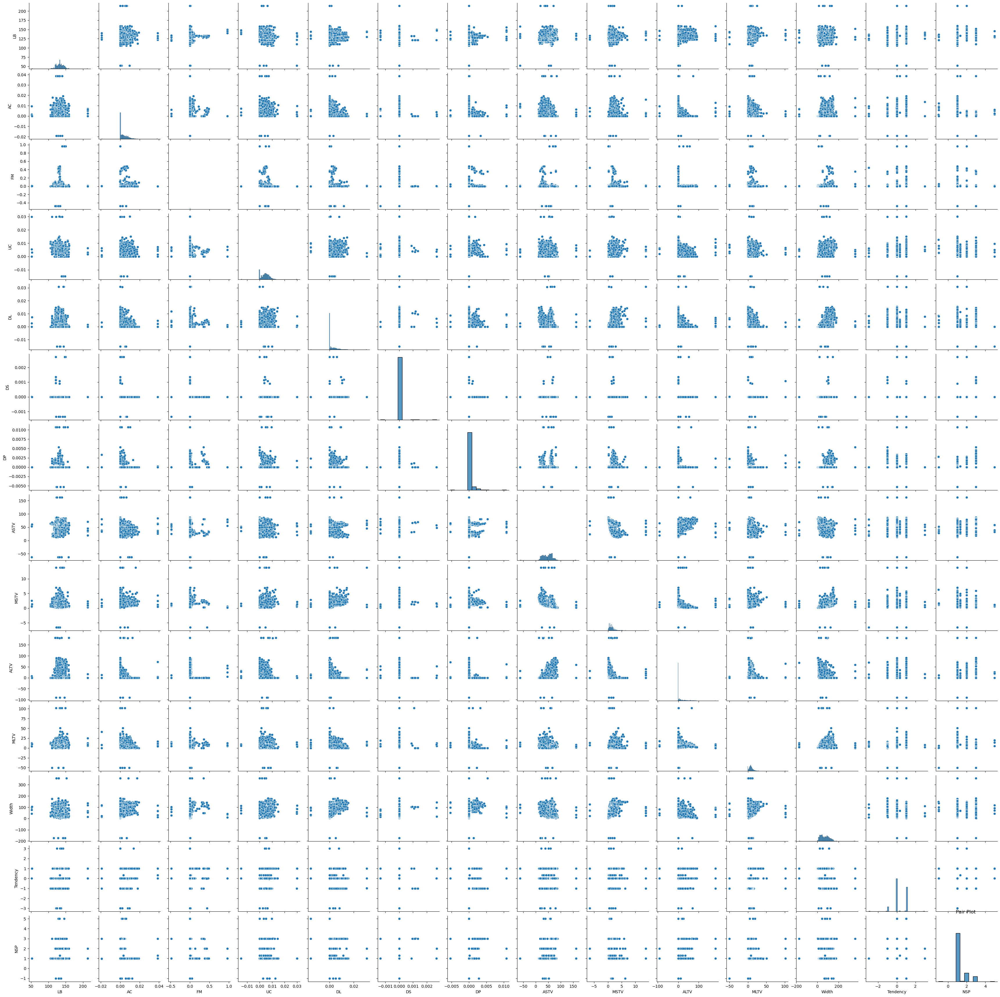

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

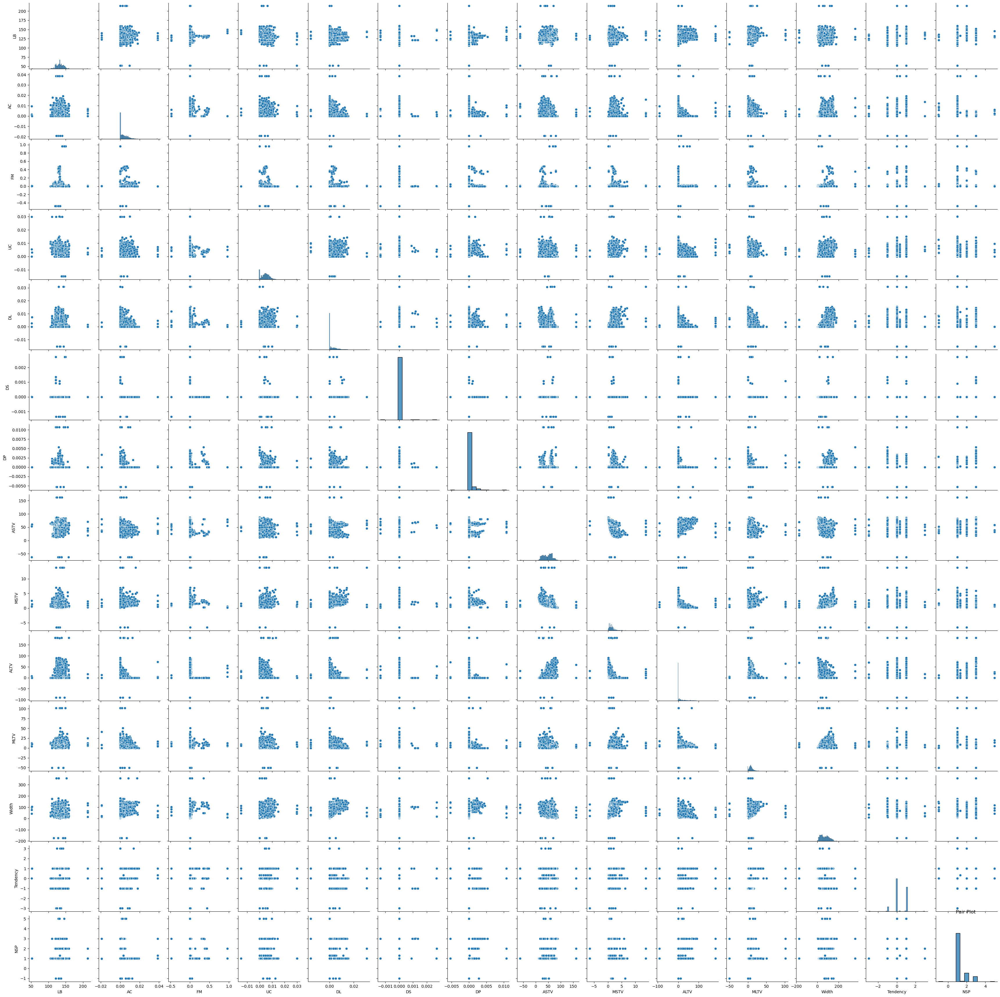

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

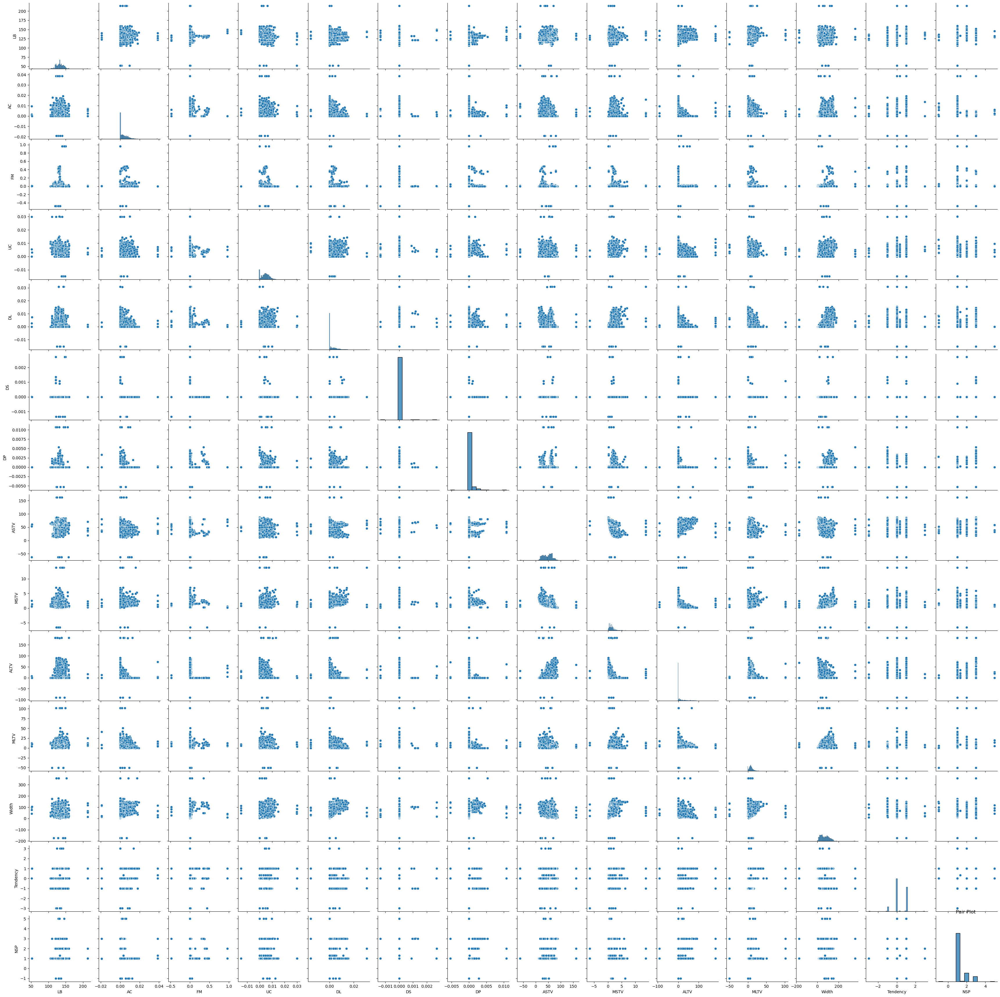

C:\Users\patil\anaconda3\python\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x600 with 0 Axes>

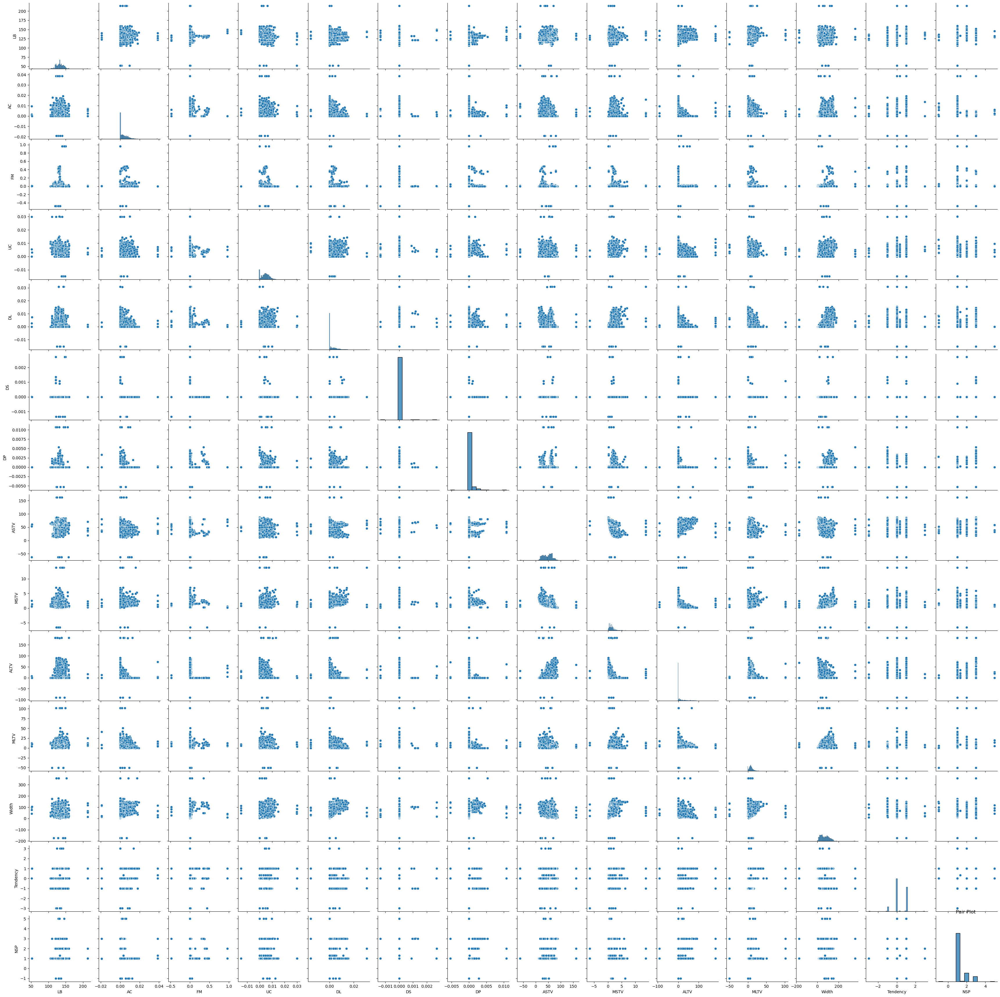

In [13]:
# Pair plot for the dataset

# numerical columns for visualization
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Generate Pair plots for each numerical variable
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.pairplot(df)
    plt.title('Pair Plot ')
    plt.grid(True)
    plt.show()




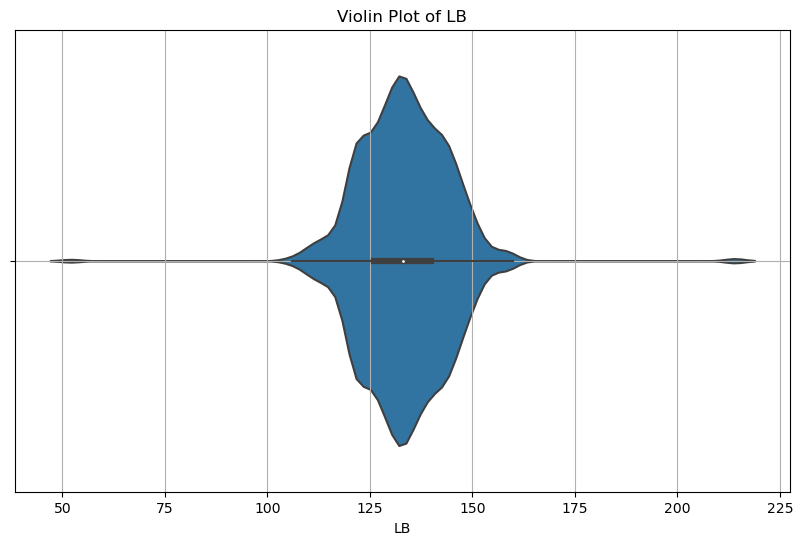

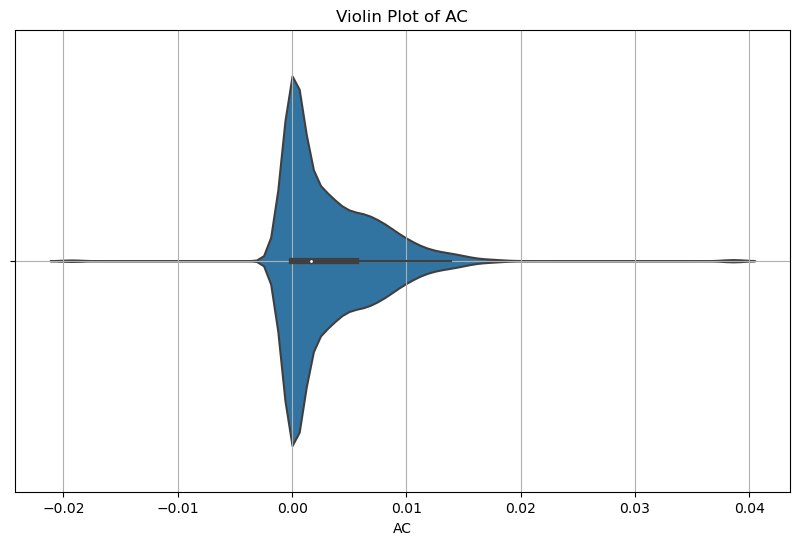

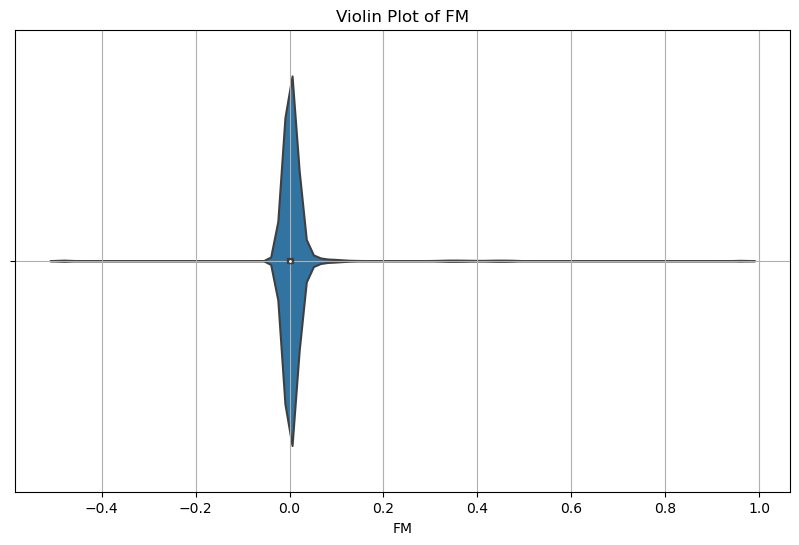

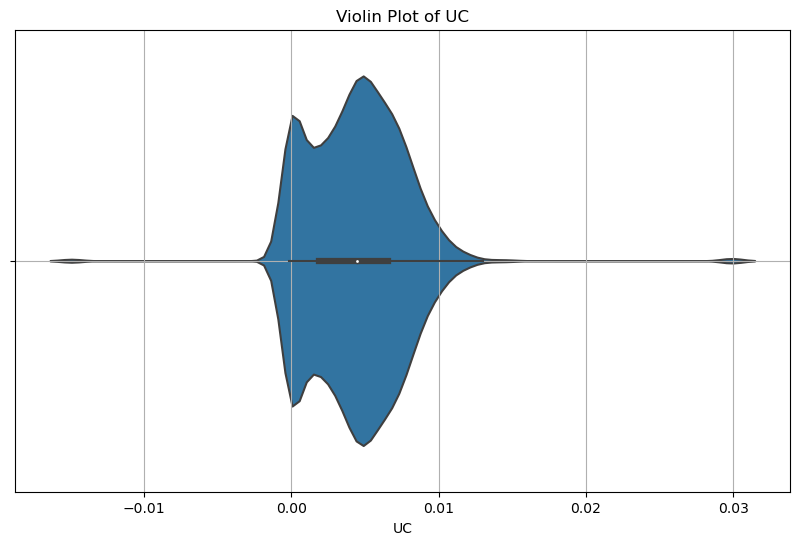

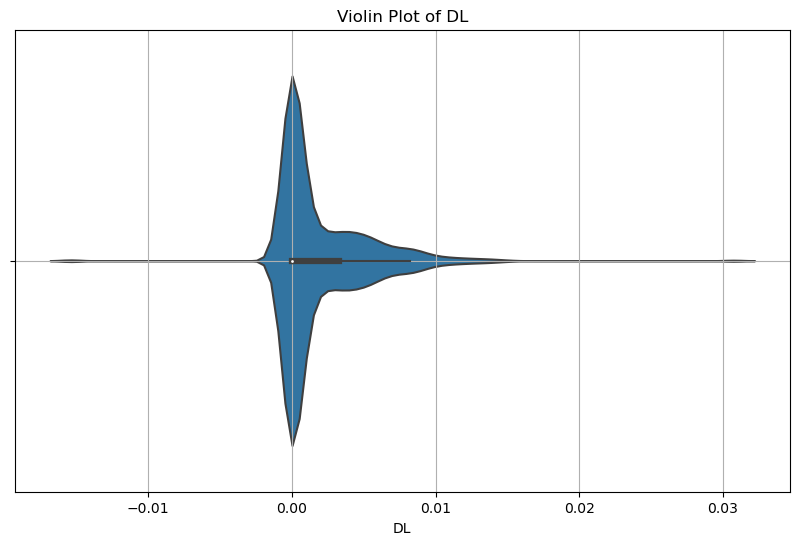

...

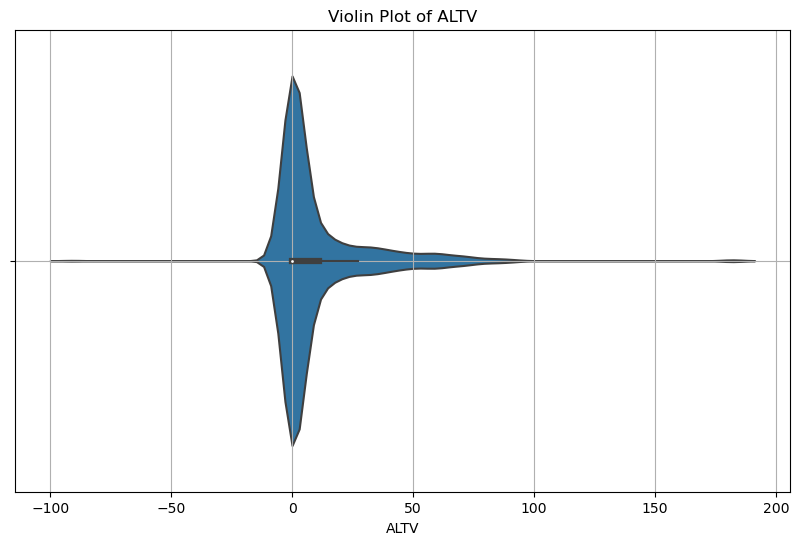

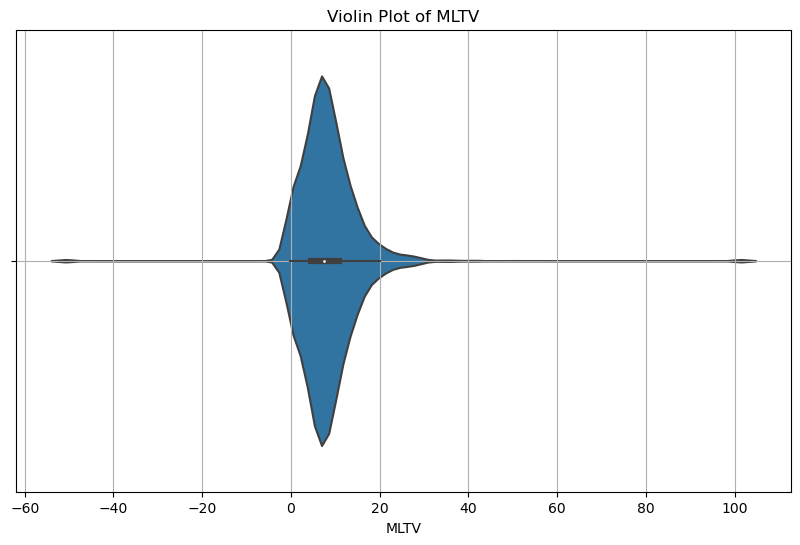

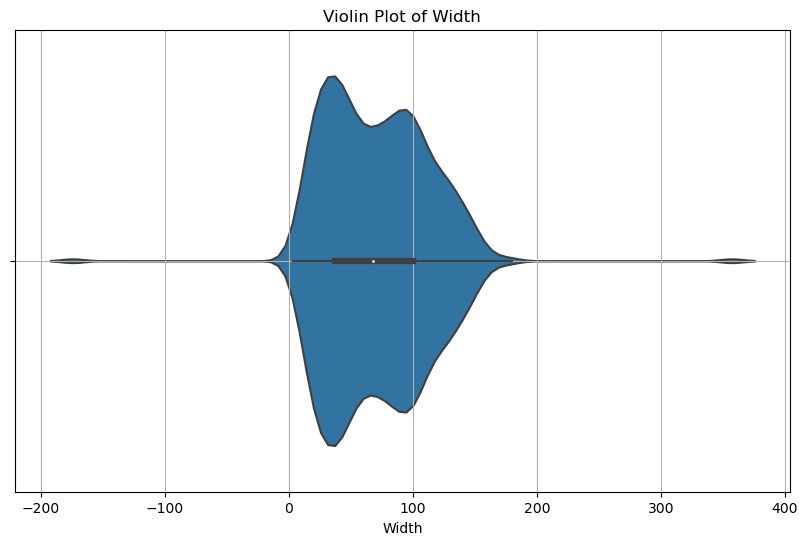

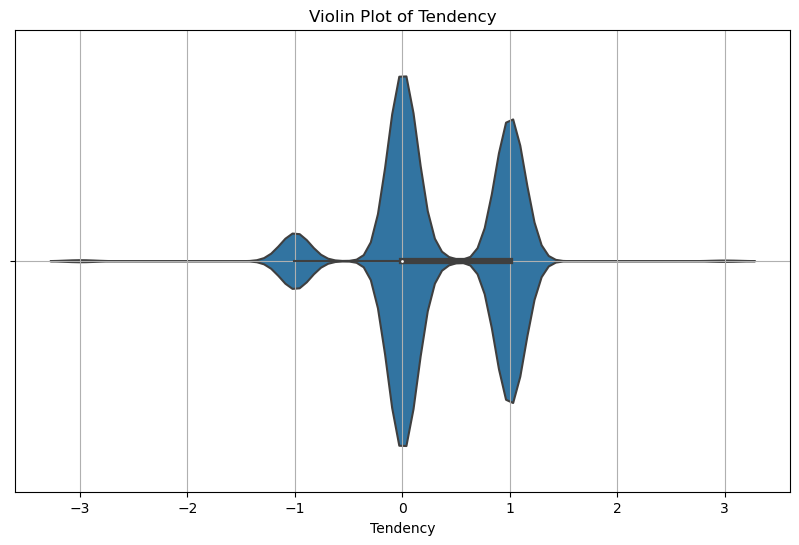

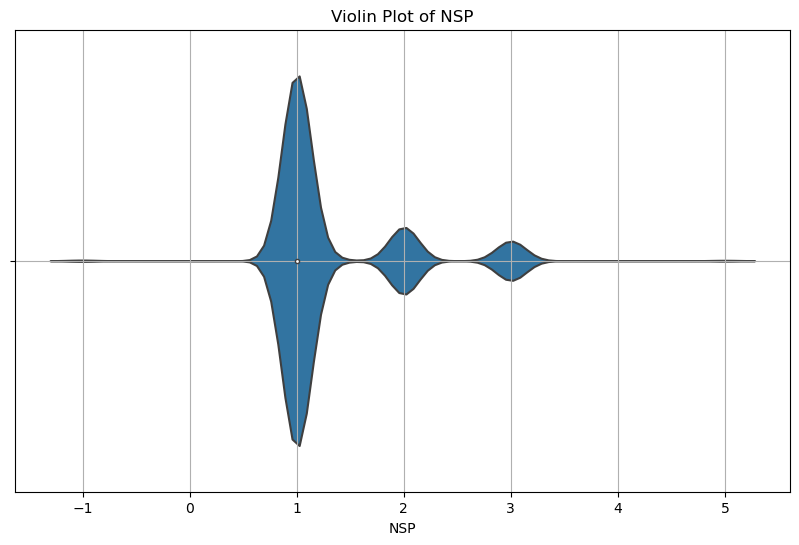

In [14]:
# numerical columns for visualization
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Generate violin plots for each numerical variable
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=df[column])
    plt.title(f'Violin Plot of {column}')
    plt.xlabel(column)
    plt.grid(True)
    plt.show()


# 4.	Pattern Recognition and Insights:

In [15]:
# Identify any correlations between variables and discuss their potential implications

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Find the strongest positive and negative correlations
strongest_positive_correlations = correlation_matrix.abs().unstack().sort_values(ascending=False).drop_duplicates()
strongest_negative_correlations = correlation_matrix.abs().unstack().sort_values().drop_duplicates()

# Print the strongest correlations
print("Strongest Positive Correlations:")
print(strongest_positive_correlations[1:])
print("\nStrongest Negative Correlations:")
print(strongest_negative_correlations[1:])

# Discuss the potential implications of the strongest correlations
# For example:
''' - If LB and AC have a strong positive correlation, it suggests that as LB increases, AC tends to increase as well. 
This could have implications for understanding the relationship between these two variables and how they might affect each other.'''
'''- If FM and UC have a strong negative correlation, it suggests that as FM increases, UC tends to decrease.
This could have implications for understanding the trade-offs between these two variables and how they might be managed.'''


Strongest Positive Correlations:
Width  MSTV    0.433064
NSP    ASTV    0.421313
MSTV   DL      0.410102
Width  DL      0.408664
NSP    ALTV    0.365357
                 ...   
FM     MLTV    0.006237
DS     LB      0.005438
       ALTV    0.004392
DP     DS      0.004285
MLTV   LB      0.003457
Length: 91, dtype: float64

Strongest Negative Correlations:
DP    DS       0.004285
ALTV  DS       0.004392
DS    LB       0.005438
MLTV  FM       0.006237
DS    UC       0.006922
                 ...   
DL    Width    0.408664
MSTV  DL       0.410102
NSP   ASTV     0.421313
MSTV  Width    0.433064
LB    LB       1.000000
Length: 91, dtype: float64


'- If FM and UC have a strong negative correlation, it suggests that as FM increases, UC tends to decrease.\nThis could have implications for understanding the trade-offs between these two variables and how they might be managed.'

In [16]:
# Display the first few rows to inspect for temporal data
print(df.head())

# Assuming the dataset has a column 'Time' for temporal information (replace 'Time' with the actual column name)
if 'Time' in df.columns:
    # Convert 'Time' column to datetime if not already in datetime format
    df['Time'] = pd.to_datetime(df['Time'])

    # Set 'Time' column as the index
    df.set_index('Time', inplace=True)

    # Plot time series data for a few selected columns
    columns_to_plot = ['LB', 'ASTV', 'MSTV']  # Replace with columns of interest
    for column in columns_to_plot:
        plt.figure(figsize=(12, 6))
        plt.plot(data.index, df[column])
        plt.title(f'Time Series Plot of {column}')
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.grid(True)
        plt.show()
    else:
        print("No temporal data available in the dataset.")


           LB        AC   FM        UC        DL   DS   DP  ASTV  MSTV  ALTV  \
0  120.000000  0.000000  0.0  0.000000  0.000000  0.0  0.0  73.0   0.5  43.0   
1  132.000000  0.006380  0.0  0.006380  0.003190  0.0  0.0  17.0   2.1   0.0   
2  133.000000  0.003322  0.0  0.008306  0.003322  0.0  0.0  16.0   2.1   0.0   
3  134.000000  0.002561  0.0  0.007742  0.002561  0.0  0.0  16.0   2.4   0.0   
4  131.948232  0.006515  0.0  0.008143  0.000000  0.0  0.0  16.0   2.4   0.0   

   MLTV  Width  Tendency  NSP  
0   2.4   64.0  0.999926  2.0  
1  10.4  130.0  0.000000  1.0  
2  13.4  130.0  0.000000  1.0  
3  23.0  117.0  1.000000  1.0  
4  19.9  117.0  1.000000  1.0  


# 5.	Conclusion:

In [17]:
# key insights and patterns discovered through your exploratory analysis  of above data

# 1. Missing Values:
# - The initial data set contained missing values, which were addressed through dropping columns with high missing values and imputing remaining missing values with the mean.

# 2. Mixed Data Types:
# - Some columns had mixed data types, which were converted to appropriate numeric types.

# 3. Outliers:
# - Outliers were identified using IQR and replaced with the median of the corresponding column.

# 4. Data Distribution:
# - After cleaning the data, the distribution of numerical variables appeared more normal.

# 5. Correlations:
# - Strongest positive and negative correlations were identified, indicating potential relationships between variables.

# 6. Time Series Analysis:
# - If the data set has a time column, rolling averages and autocorrelation can be calculated to analyze trends and dependencies over time.

# 7. Visualization:
# - Histograms, boxplots, scatter plots, heatmaps, pair plots, and violin plots were used to visualize the data and gain insights into relationships between variables.

# 8. Further Analysis:
# - Additional analyses could involve building predictive models, clustering data points, or performing time series forecasting.

# Overall, the exploratory analysis revealed several key insights and patterns in the data, which can be used to guide further investigation and modeling efforts.


In [18]:
# Discuss how these findings could impact decision-making or further analyses.

# Impact of findings on decision-making:

# 1. Identifying strong correlations between variables can help decision-makers understand how changes in one variable might affect another.
# For example, if LB and AC have a strong positive correlation, decision-makers might consider strategies that aim to increase or decrease both LB and AC simultaneously.

# 2. Addressing missing values and outliers ensures that decision-making is based on accurate and reliable data.
# By removing unreliable data points and imputing missing values appropriately, decision-makers can avoid making decisions based on incomplete or biased information.

# 3. Understanding the distribution of variables can help decision-makers set realistic expectations and make informed judgments.
# For instance, if the distribution of LB shows a high concentration of values around the mean, decision-makers might be more confident in predicting future values of LB within a certain range.

# Impact of findings on further analyses:

# 1. Identifying strong correlations can guide feature selection for building predictive models.
# Variables that are highly correlated with the target variable or with each other can be prioritized as potential features for model training.

# 2. Addressing missing values and outliers is crucial for ensuring the validity of statistical analyses.
# By cleaning the data beforehand, researchers can avoid introducing bias or errors into their analyses.

# 3. Understanding the distribution of variables can help researchers choose appropriate statistical methods and interpret their results accurately.
# For example, if a variable has a skewed distribution, non-parametric statistical methods might be more suitable for analyzing the data.

# Overall, the findings from the exploratory analysis can have a significant impact on decision-making and further analyses by providing valuable insights into the relationships between variables, the quality of the data, and the underlying patterns in the data.

